In [58]:
import pandas as pd
import numpy as np
from pylab import rcParams
rcParams['figure.figsize'] = 14, 8
from IPython.display import display_html

import seaborn as sns
import matplotlib.pyplot as plt
import os
import re

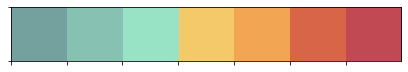

In [3]:
# pal = sns.color_palette("GnBu_d")
# pal = sns.light_palette((210, 90, 60), input="husl")
# pal = sns.cubehelix_palette(8)
pal = ['#74a09e','#86c1b2','#98e2c6','#f3c969','#f2a553', '#d96548', '#c14953']
sns.palplot(pal)

In [28]:
chest_train = pd.read_csv('train.csv')
chest_train.head().style.set_table_attributes("style= 'display:inline'").set_caption('Head Train Data')

# display_html(chest_train._repr_html_(), raw = True)

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker


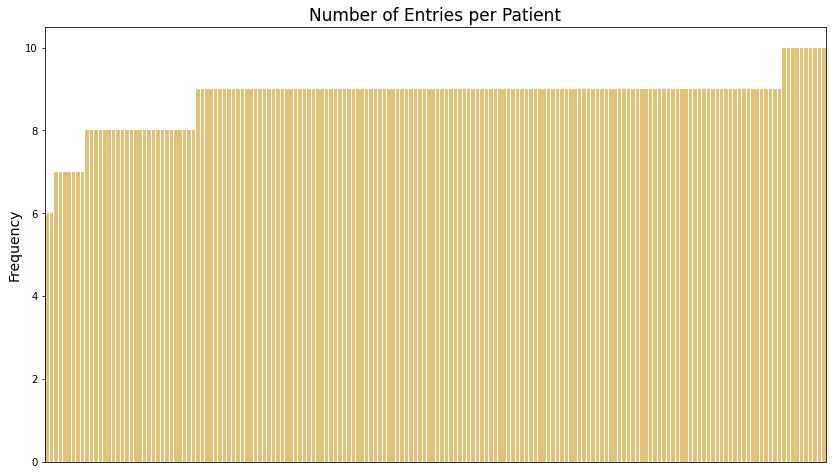

In [5]:
data = chest_train.groupby('Patient')['Weeks'].count().reset_index(drop = False)
data = data.sort_values(['Weeks']).reset_index(drop = True)


p = sns.barplot(data['Patient'], data['Weeks'], color = pal[3])
plt.title("Number of Entries per Patient", fontsize = 17)
plt.xlabel('Patient', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

p.axes.get_xaxis().set_visible(False);

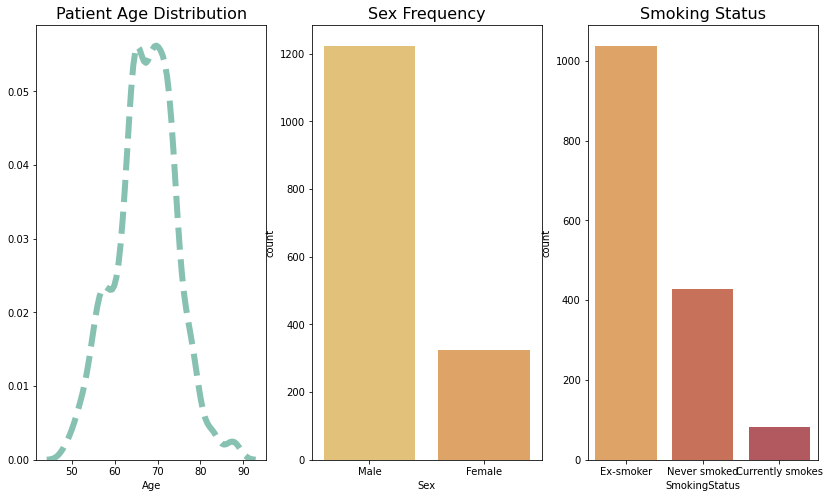

In [6]:
#Creation of subplots
f, (ax1, ax2, ax3) = plt.subplots(1, 3)

plt_1 = sns.distplot(chest_train['Age'], ax = ax1, color= pal[1], hist = False,
                     kde_kws= dict(lw = 6, ls = '--'))
plt_2 = sns.countplot(chest_train['Sex'], ax = ax2, palette= pal[3:5])
plt_3 = sns.countplot(chest_train['SmokingStatus'], ax = ax3, palette= pal[4:7])


plt_1.set_title("Patient Age Distribution", fontsize=16)
plt_2.set_title("Sex Frequency", fontsize=16)
plt_3.set_title("Smoking Status", fontsize=16);

In [7]:
chest_train.describe()

,Weeks,FVC,Percent,Age
count,1549.000000,1549.000000,1549.000000,1549.000000
mean,31.861846,2690.479019,77.672654,67.188509
std,23.247550,832.770959,19.823261,7.057395
min,-5.000000,827.000000,28.877577,49.000000
25%,12.000000,2109.000000,62.832700,63.000000
50%,28.000000,2641.000000,75.676937,68.000000
75%,47.000000,3171.000000,88.621065,72.000000
max,133.000000,6399.000000,153.145378,88.000000


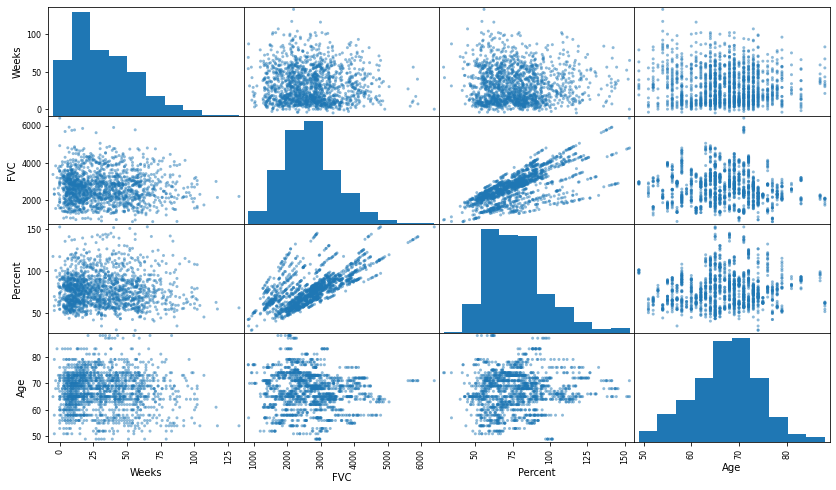

In [8]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

scatter_matrix(chest_train)
plt.show()

In [9]:
chest_train.corr()

,Weeks,FVC,Percent,Age
Weeks,1.000000,-0.041447,-0.012536,-0.059473
FVC,-0.041447,1.000000,0.671964,-0.094125
Percent,-0.012536,0.671964,1.000000,0.095949
Age,-0.059473,-0.094125,0.095949,1.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fac843d2b80>,
      dtype=object)

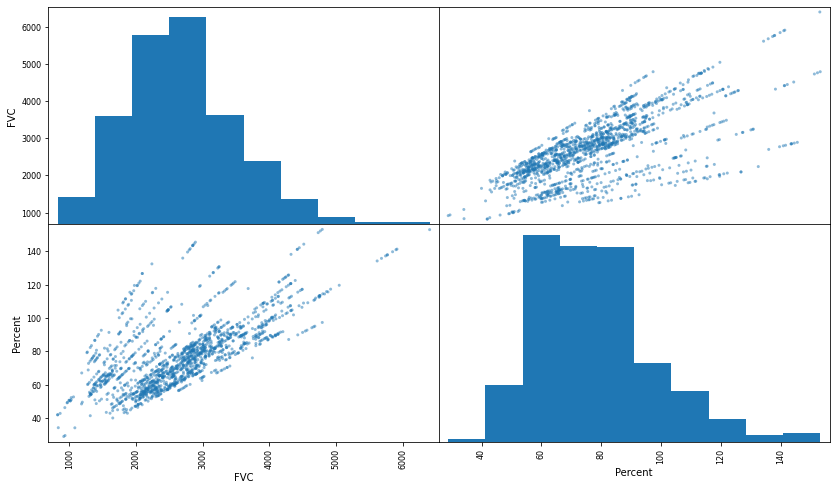

In [10]:
attr = ['FVC', 'Percent']
scatter_matrix(chest_train[attr])

## Inference

   * Patient Age range [49, 88]; Average Age 67
   
   * Average normal values in healthy males aged 20-60 range from 5500 to 4750 liters, and average normal values for females aged 20-60 range from 3750 to 3250 liters. 
   
   * FVC in the dataset was measured in mL. 
   * Range = [827.00, 6399.00] (Irrespective of the sex) 
   * Average = 2690.47 
   
   * As Age increases FVC drops; it happens but it isn't highly negatively correlated.
   * Logically, it might worth looking into

## Questions:
* How is the Percent calculated is it FEV1/FVC ??
* If not then how is FVC moderately correlated to Percent?


In [11]:
chest_train

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker
...,...,...,...,...,...,...,...
1544,ID00426637202313170790466,13,2712,66.594637,73,Male,Never smoked
1545,ID00426637202313170790466,19,2978,73.126412,73,Male,Never smoked
1546,ID00426637202313170790466,31,2908,71.407524,73,Male,Never smoked
1547,ID00426637202313170790466,43,2975,73.052745,73,Male,Never smoked


In [12]:
male_ = chest_train['Sex'] == 'Male'
female_ = chest_train['Sex'] == 'Female'

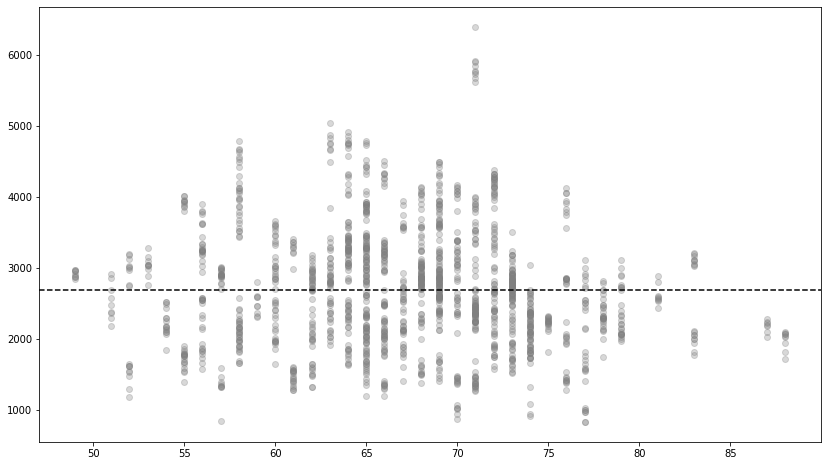

In [13]:
plt.scatter(chest_train['Age'], chest_train['FVC'], c = 'gray', alpha= 0.3)
plt.axhline(chest_train['FVC'].mean(), linestyle = '--', c = 'black')

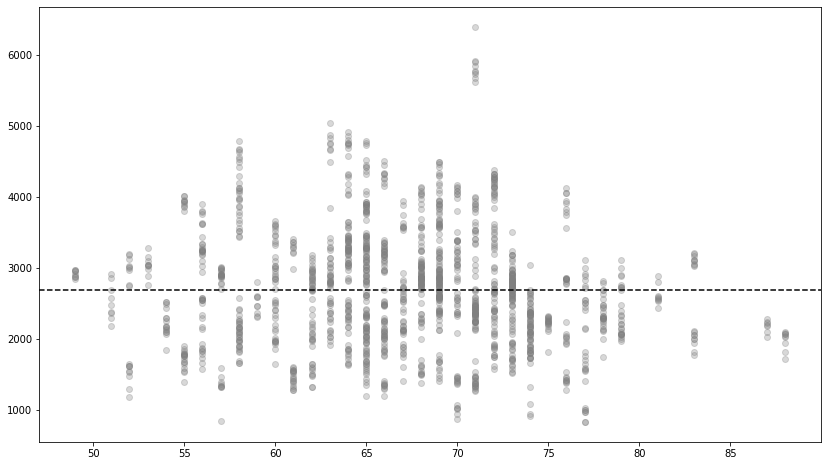

In [14]:
plt.scatter(chest_train['Age'], chest_train['FVC'], c = 'gray', alpha= 0.3)
plt.axhline(chest_train['FVC'].mean(), linestyle = '--', c = 'black')

In [15]:
import pydicom
from pydicom.data import get_testdata_file

In [16]:
# file_patient_1 = pydicom.filereader.read_dicomdir('/home/knk/Documents/Kaggle/OSIC /osic-pulmonary-fibrosis-progression/train/ID00009637202177434476278')

In [17]:
fpath = get_testdata_file("CT_small.dcm")

In [18]:
# pip install scikit-image

In [18]:
# pip install opencv-python

In [ ]:
file = pydicom.dcmread('patient_1.dcm')

from skimage import exposure
import cv2

file_pixel = file.pixel_array * 128
file_pixel = exposure.equalize_adapthist(file_pixel)
cv2.imshow('First CV use', file_pixel)

cv2.waitKey()

In [ ]:
help(read_dicomdir)

In [ ]:
from pydicom.filereader import read_dicomdir

folder = read_dicomdir(filename= '~/Documents/Kaggle/OSIC /osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430')

In [ ]:
plt.imshow(file.pixel_array, cmap = plt.cm.bone)

In [35]:
train_try = chest_train.copy()
train_try

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker
...,...,...,...,...,...,...,...
1544,ID00426637202313170790466,13,2712,66.594637,73,Male,Never smoked
1545,ID00426637202313170790466,19,2978,73.126412,73,Male,Never smoked
1546,ID00426637202313170790466,31,2908,71.407524,73,Male,Never smoked
1547,ID00426637202313170790466,43,2975,73.052745,73,Male,Never smoked


In [36]:
directory_path = "../OSIC/osic-pulmonary-fibrosis-progression/train"

train_try['Path'] = directory_path + '/' + train_try['Patient']

train_try['CT_number'] = 0

for k, path in enumerate(train_try["Path"]):
    train_try["CT_number"][k] = len(os.listdir(path))

<ipython-input-36-8c19e9ca003a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_try["CT_number"][k] = len(os.listdir(path))


In [37]:
train_try

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus,Path,CT_number
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker,../OSIC/osic-pulmonary-fibrosis-progression/tr...,30
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker,../OSIC/osic-pulmonary-fibrosis-progression/tr...,30
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker,../OSIC/osic-pulmonary-fibrosis-progression/tr...,30
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker,../OSIC/osic-pulmonary-fibrosis-progression/tr...,30
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker,../OSIC/osic-pulmonary-fibrosis-progression/tr...,30
...,...,...,...,...,...,...,...,...,...
1544,ID00426637202313170790466,13,2712,66.594637,73,Male,Never smoked,../OSIC/osic-pulmonary-fibrosis-progression/tr...,408
1545,ID00426637202313170790466,19,2978,73.126412,73,Male,Never smoked,../OSIC/osic-pulmonary-fibrosis-progression/tr...,408
1546,ID00426637202313170790466,31,2908,71.407524,73,Male,Never smoked,../OSIC/osic-pulmonary-fibrosis-progression/tr...,408
1547,ID00426637202313170790466,43,2975,73.052745,73,Male,Never smoked,../OSIC/osic-pulmonary-fibrosis-progression/tr...,408


In [41]:
data = train_try.groupby('Patient')['CT_number'].first().reset_index(drop = False)

#Sort on number od CT scans
data = data.sort_values(['CT_number']).reset_index(drop = True)

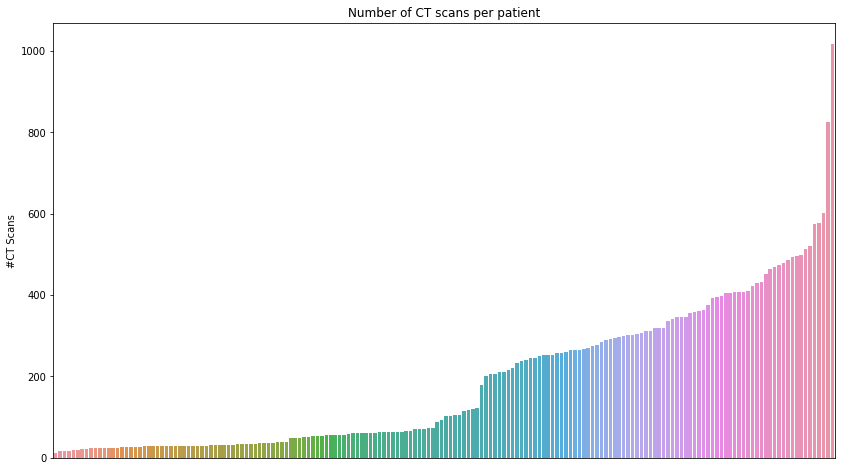

In [46]:
#Plot 
plot_ct = sns.barplot(data['Patient'], data['CT_number'])
plt.title('Number of CT scans per patient')
plt.xlabel('Patient')
plt.ylabel('#CT Scans')

plot_ct.axes.get_xaxis().set_visible(False);

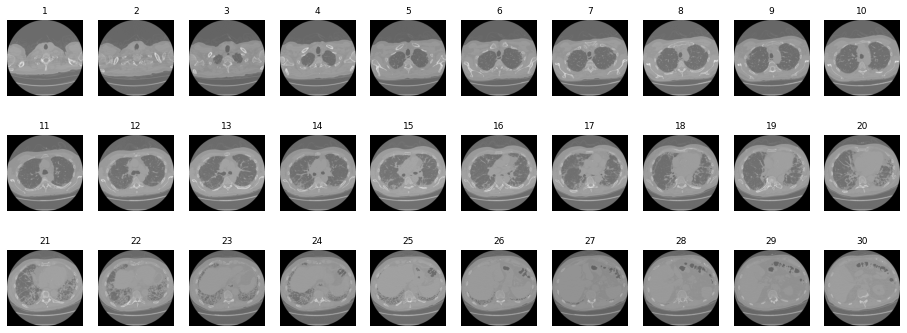

In [92]:
patient_dir = "../OSIC/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430"
dcm_files = []
datasets = []

for dcm in list(os.listdir(patient_dir)):
    dcm_files.append(dcm)
dcm_files.sort(key = lambda f: int(re.sub('\D', '', f)))
# print(dcm_files)

for dcm in dcm_files:
    path = patient_dir + "/" + dcm
    datasets.append(pydicom.dcmread(path))
# datasets

fig = plt.figure(figsize = (16, 6))
cols = 10
rows = 3 


for i in range(1, cols*rows + 1):
    img = datasets[i - 1].pixel_array
    fig.add_subplot(rows, cols, i)
    plt.imshow(img, cmap = 'gray')
    plt.title(i, fontsize = 9)
    plt.axis('off');

In [93]:
from PIL import Image
from IPython.display import Image as show_gif
import scipy.misc
import matplotlib

In [105]:
def create_gif(ct_number = 87):
    patient = train_try[train_try['CT_number'] == ct_number].sample(random_state = 42)['Patient'].values[0]
    
    patient_dir = "../OSIC/osic-pulmonary-fibrosis-progression/train" + '/' + patient
    datasets = []
    
    files = []
    for dcm in list(os.listdir(patient_dir)):
        files.append(dcm)
    files.sort(key = lambda x: int(re.sub('\D', '', x)))
    
    for dcm in files:
        path = patient_dir + '/' + dcm
        datasets.append(pydicom.dcmread(path))
        
    #Create a dir to save png images
    if os.path.isdir(f'png_{patient}') == False:
        os.mkdir(f'png_{patient}')
    
    #Save image to png
    for i in range(len(datasets)):
        img = datasets[i].pixel_array
        matplotlib.image.imsave(f'png_{patient}/img{i}.png', img)
        
    files = []
    for png in list(os.listdir(f"../OSIC/png_{patient}")):
        files.append(png)
    files.sort(key=lambda f: int(re.sub('\D', '', f)))
    
    frames = []
    
    for file in files:
        new_frame = Image.open(f'../OSIC/png_{patient}/' + file)
        frames.append(new_frame)
        
    frames[0].save(f'gif_{patient}.gif', format = 'GIF', append_images = frames[1 :],
                  save_all = True, duration = 200, loop = 0)

In [106]:
create_gif()

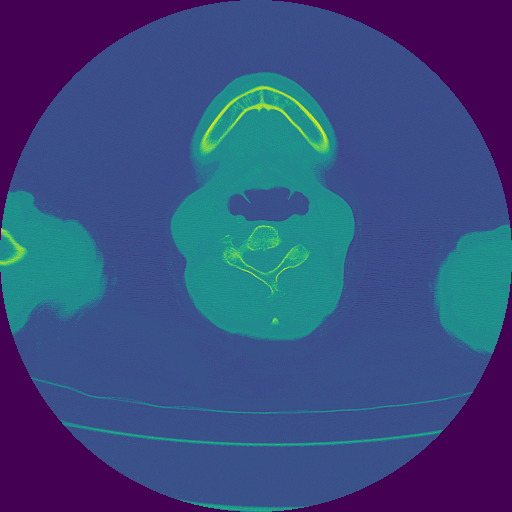

In [108]:
show_gif(filename= './gif_ID00199637202248141386743.gif', format = 'png', width = 400, height = 400)